In [5]:
# import numpy as np
import matplotlib.pyplot as plt

from IPython.display import display

from md_Helpers import hot_spike
from md_Helpers import runs
from md_Helpers import excitation_evolution
from md_Helpers import visualization as vh


# ============================================================
# User-controlled physical parameters
# ============================================================

params = dict(
    n_fcc_cells=30,
    target_rho=0.720,
    kT=0.800,
    source_nsteps=1_000_000,
    source_seed=1,

    radius=3.0,
    injected_energy=1000,
    method="velocity_rescale_com",

    random_location=False,
)



# ============================================================
# User-controlled NPH test parameters
# ============================================================

# Default dt1 and nsteps1
dt1 = 0.0005
nsteps1 = 200_000


# User choice
dt2 = 0.005
nsteps2 = 80_000

# None means use the mean of the last pressure_tail_samples
# measurements from the homogeneous thermalized state.
pressure = None
pressure_tail_samples = 100

# None means tauS = 10000 * dt2.
tauS = 500

# Mask particles outside a sphere whose diameter is 0.75 times
# the thermalized box length.
outer_mask_diameter_fraction = 0.75

# Use the outer-mask pressure contribution to control the barostat
# while scaling all particle positions with the box.
nph_mask_controls_box = True

# Permitted volume relative to the beginning of each segment.
# An upper volume ratio of 2.0 permits approximately 26% growth
# in each box length for an isotropically scaled box.
nph_box_volume_ratio_bounds = (0.75, 3.0)

# Check the box-volume safety limits every 100 integration steps.
nph_safety_check_period = 100


# ============================================================
# Run/load the masked NPH simulation
#
# Order performed internally:
#   1. Load/check thermalized state
#   2. Measure thermalized-state pressure
#   3. Create/load hot-spike excitation
#   4. Create fixed outer-particle mask
#   5. Choose tauS
#   6. Perform two-stage dt evolution
# ============================================================

nph_test = hot_spike.get_or_create_hot_spike(
    **params,

    ensemble="NPH",

    pressure=pressure,
    pressure_tail_samples=pressure_tail_samples,

    outer_mask_diameter_fraction=outer_mask_diameter_fraction,
    nph_mask_controls_box=nph_mask_controls_box,

    tauS=tauS,
    pressure_couple="xyz",
    barostat_gamma=0.0,

    nph_box_volume_ratio_bounds=nph_box_volume_ratio_bounds,
    nph_safety_check_period=nph_safety_check_period,

    dt1=dt1,
    nsteps1=nsteps1,

    dt2=dt2,
    nsteps2=nsteps2,

    overwrite=False,
    overwrite_initial=False,
    overwrite_source=False,

    create_source_if_missing=True,
    reject_phase_separated_source=True,
)



Thermalized state exists: checking phase separation.
Loaded existing thermalized state:
/exp/e961/data/MDsims-data/pnichols/Thermalized_States_v3/FCC/n_cells_30/rho_0.720/kT_0.800/nsteps_1000000/seed_1/randomization.gsd
NPH pressure from thermalized source tail: -0.23144116 +/- 0.0103 (100 samples)
Thermalized state exists: checking phase separation.
Loaded existing thermalized state:
/exp/e961/data/MDsims-data/pnichols/Thermalized_States_v3/FCC/n_cells_30/rho_0.720/kT_0.800/nsteps_1000000/seed_1/randomization.gsd


Loaded existing hot-spike initial state:
/exp/e961/data/MDsims-data/pnichols/Excitation_States_v3/FCC/n_cells_30/source_kT_0.800/rho_0.720/source_nsteps_1000000/source_seed_1/method_velocity_rescale_com/radius_3.000/energy_1000.000/center_box/excitation_initial.gsd
NPH outer mask: 84144 particles (77.911%), radius=19.9248
NPH box pressure control: experimental outer-mask split integrator
NPH outer-mask pressure target: -0.18031838 = -0.23144116 x 0.779111


THERMALIZED PRESSURE
Thermalized state:
/exp/e961/data/MDsims-data/pnichols/Thermalized_States_v3/FCC/n_cells_30/rho_0.720/kT_0.800/nsteps_1000000/seed_1/randomization.gsd

Thermalized log:
/exp/e961/data/MDsims-data/pnichols/Thermalized_States_v3/FCC/n_cells_30/rho_0.720/kT_0.800/nsteps_1000000/seed_1/randomization_log.hdf5

Pressure tail mean: -0.23144116
Pressure tail std:  0.01028925
Samples used:       100
Pressure source:    thermalized_source_tail_scaled_by_outer_fraction

EXCITATION
Excitation radius:  3.000000
Injected energy:    1000.000000
Spike center:       (0.0000, 0.0000, 0.0000)
Excited particles:  75

OUTER PRESSURE MASK
Diameter fraction:  0.750 L
Mask radius:        19.924848
Outer particles:    84,144
Inner particles:    23,856
Outer fraction:     77.911%
Membership:         fixed_tags_selected_after_excitation

NPH EVOLUTION
Pressure target:    -0.18031838
tauS:               500.000000
dt1:                0.0005
nsteps1:            200,000
dt2:                0.00

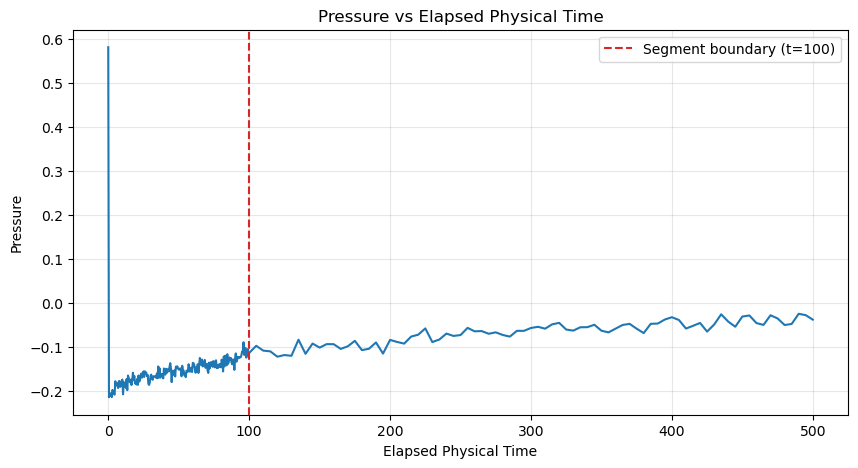

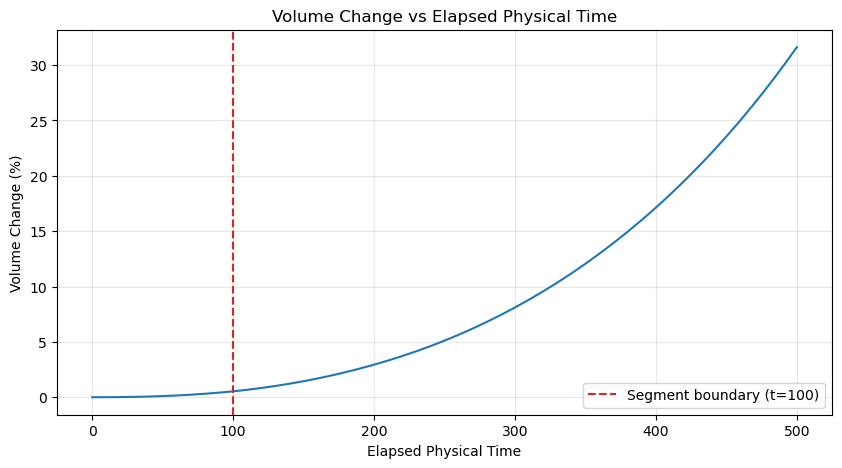

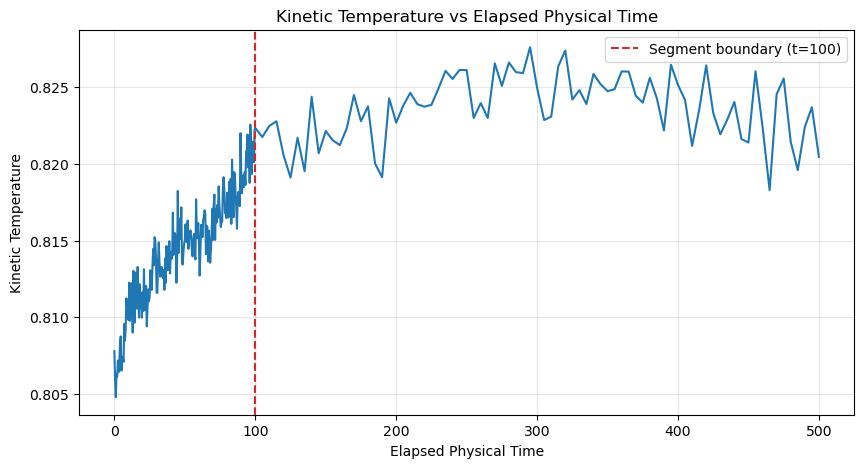

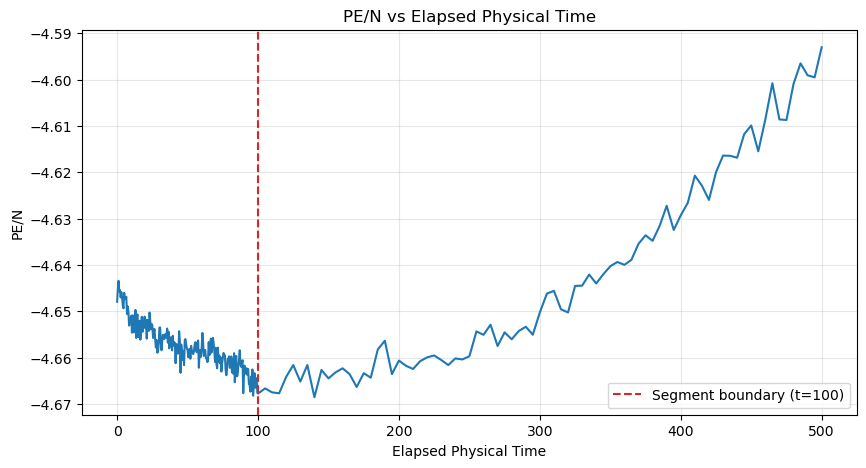

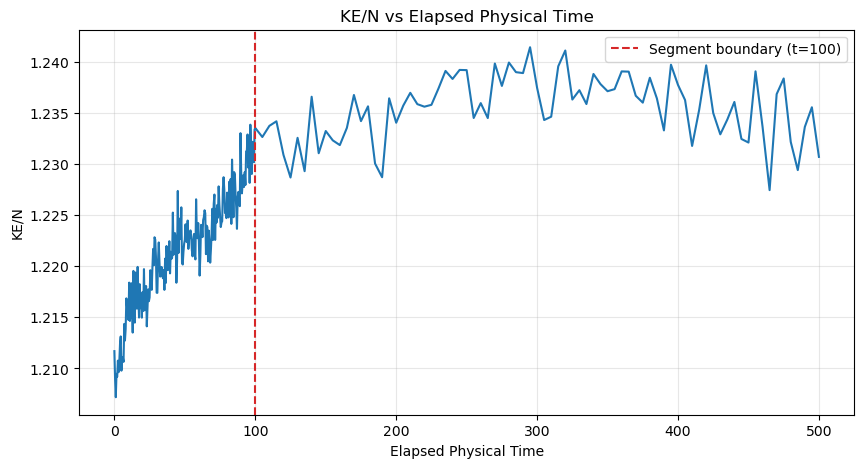


FINAL BOX
Initial box:       [53.13292694 53.13292694 53.13292694]
Final box:         [58.22773361 58.22773361 58.22773361]
Initial volume:    149999.98714177
Final volume:      197419.32351583
Volume change:     +31.61289%


In [7]:
import numpy as np

# ============================================================
# Inspect the thermalized pressure selection
# ============================================================

source_result = nph_test["initial_result"]["source_result"]

pressure_info = excitation_evolution.thermalized_source_pressure(
    source_result,
    n_last=pressure_tail_samples,
)

print("=" * 72)
print("THERMALIZED PRESSURE")
print("=" * 72)
print("Thermalized state:")
print(source_result["paths"]["state_path"])

print("\nThermalized log:")
print(source_result["paths"]["log_path"])

print(f"\nPressure tail mean: {pressure_info['pressure']:.8f}")
print(f"Pressure tail std:  {pressure_info['pressure_std']:.8f}")
print(f"Samples used:       {pressure_info['n_samples']}")
print(f"Pressure source:    {nph_test['paths']['pressure_source']}")


# ============================================================
# Inspect the excitation and fixed particle mask
# ============================================================

mask_info = excitation_evolution.build_outer_pressure_mask(
    nph_test["initial_result"],
    diameter_fraction=outer_mask_diameter_fraction,
)

creation_info = nph_test["initial_result"]["creation_info"]

print("\n" + "=" * 72)
print("EXCITATION")
print("=" * 72)
print(f"Excitation radius:  {creation_info['radius']:.6f}")
print(
    f"Injected energy:    "
    f"{creation_info['actual_injected_energy']:.6f}"
)
print(
    "Spike center:       "
    f"({creation_info['spike_center_x']:.4f}, "
    f"{creation_info['spike_center_y']:.4f}, "
    f"{creation_info['spike_center_z']:.4f})"
)
print(
    f"Excited particles:  "
    f"{creation_info['selected_particle_count']}"
)

print("\n" + "=" * 72)
print("OUTER PRESSURE MASK")
print("=" * 72)
print(
    f"Diameter fraction:  "
    f"{mask_info['diameter_fraction']:.3f} L"
)
print(f"Mask radius:        {mask_info['radius']:.6f}")
print(
    f"Outer particles:    "
    f"{mask_info['outer_particle_count']:,}"
)
print(
    f"Inner particles:    "
    f"{mask_info['inner_particle_count']:,}"
)
print(
    f"Outer fraction:     "
    f"{100 * mask_info['outer_particle_fraction']:.3f}%"
)
print(f"Membership:         {mask_info['membership']}")


# ============================================================
# Inspect tau, paths, and integration metadata
# ============================================================

manifest = excitation_evolution.read_evolution_manifest(nph_test)
manifest_run = manifest["metadata/run"]

print("\n" + "=" * 72)
print("NPH EVOLUTION")
print("=" * 72)
print(f"Pressure target:    {nph_test['paths']['pressure']:.8f}")
print(f"tauS:               {nph_test['paths']['tauS']:.6f}")
print(f"dt1:                {nph_test['paths']['dt1']}")
print(f"nsteps1:            {nph_test['paths']['nsteps1']:,}")
print(f"dt2:                {nph_test['paths']['dt2']}")
print(f"nsteps2:            {nph_test['paths']['nsteps2']:,}")
print(f"Status:             {nph_test['status']}")

print("\nNPH output folder:")
print(nph_test["paths"]["folder"])

print("\nSegment 1 log:")
print(nph_test["paths"]["segment_1"]["log_path"])

print("\nSegment 2 log:")
print(nph_test["paths"]["segment_2"]["log_path"])

print("\nManifest:")
print(nph_test["paths"]["manifest_path"])

# ============================================================
# Read the correctly stitched two-segment NPH log
# ============================================================

nph_log = excitation_evolution.read_stitched_log(nph_test)

print("\n" + "=" * 72)
print("STITCHED TIME INFORMATION")
print("=" * 72)
print(f"dt1:                   {nph_log['stitched']['dt1']}")
print(f"dt2:                   {nph_log['stitched']['dt2']}")
print(
    "Segment boundary:      "
    f"t={nph_log['stitched']['segment_boundary_time']:.6f}"
)


# ============================================================
# Plot using the same helpers as the NVE analysis
# ============================================================

vh.plot_log_quantity(
    nph_log,
    "pressure",
    figsize=(10, 5),
    show_segment_boundary=True,
)

vh.plot_log_quantity(
    nph_log,
    "volume_change",
    figsize=(10, 5),
    show_segment_boundary=True,
)

vh.plot_log_quantity(
    nph_log,
    "kinetic_temperature",
    figsize=(10, 5),
    show_segment_boundary=True,
)

vh.plot_log_quantity(
    nph_log,
    "potential_energy",
    figsize=(10, 5),
    show_segment_boundary=True,
)

vh.plot_log_quantity(
    nph_log,
    "kinetic_energy",
    figsize=(10, 5),
    show_segment_boundary=True,
)


# ============================================================
# Inspect the final box
# ============================================================

initial_frame = nph_test["initial_result"]["frame"]
final_frame = nph_test["frame"]

initial_box = np.asarray(
    initial_frame.configuration.box[:3],
    dtype=float,
)
final_box = np.asarray(
    final_frame.configuration.box[:3],
    dtype=float,
)

initial_volume = float(np.prod(initial_box))
final_volume = float(np.prod(final_box))

print("\n" + "=" * 72)
print("FINAL BOX")
print("=" * 72)
print(f"Initial box:       {initial_box}")
print(f"Final box:         {final_box}")
print(f"Initial volume:    {initial_volume:.8f}")
print(f"Final volume:      {final_volume:.8f}")
print(
    f"Volume change:     "
    f"{100 * (final_volume / initial_volume - 1):+.5f}%"
)

In [8]:
# ============================================================
# Animate the masked particles and changing NPH box
# ============================================================

masked_animation = (
    vh.animate_masked_nph_hot_spike_xy_slice_trajectory(
        nph_test,

        # Thickness of the displayed x-y slice
        fraction=0.08,

        # Same frame-selection controls as the NVE animation
        stride=2,
        max_frames=100,

        # Show every xth particle to keep rendering manageable
        particle_stride=1,

        point_size=1,
        alpha=0.7,
        interval=100,

        masked_color="tab:orange",
        inner_color="tab:blue",

        show_box=True,
        show_mask_boundary=True,
        show_radius=True,
    )
)

display(masked_animation)